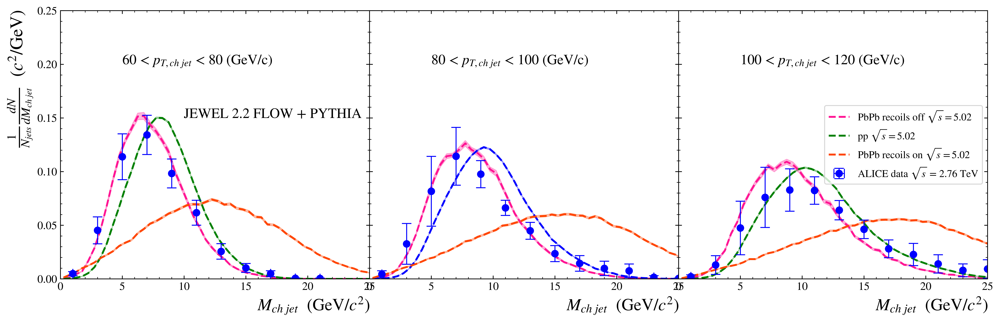

In [6]:
#Gráficos para as curvas de 5.02 FLOW jewel 2.2

import yoda
import matplotlib.pyplot as plt
import numpy as np
import scipy as sc
from matplotlib.ticker import AutoMinorLocator
import os
import jetmass



#função para fazer o gráfico dos dados experimentais do ATLAS
def DataFromExperiment(file, scatter, min = 0, max = 0):
    '''
    Grab data from the Yoda.Scatter2D named scatter from the file yoda, following
    the method that colaborations (ALICE, ATLAS, CMS) save them.

    (str, str) -> (list(np.array))
    '''
    data = yoda.read(file)[scatter]

    if max == 0:
        max = len(data.xVals()) + 1

    x = np.asarray(data.xVals())[min:max]
    y = np.asarray(data.yVals())[min:max]
    err = np.asarray((data.yMaxs() - data.yMins()) / 2)[min:max]
    errx = np.asarray((data.xMaxs() - data.xMins()) / 2)[min:max]
    return [x, y, err, errx]






plt.style.use('plotconfig.mplstyle')


# Useful documentation:
# YODA: https://yoda.hepforge.org/pydoc/
# MATPLOTLIB: https://matplotlib.org/
# NUMPY: https://numpy.org/doc/

# Don't forget to load necessary packages in SAMPA
# source /cvmfs/alice.cern.ch/etc/login.sh
# eval `alienv printenv VO_ALICE@Rivet::2.7.2-alice2-1`




#Jewel 2.2 flow PbPb recoils off 5.02
flowreoff = '/home/monalisa/Desktop/Mestrado/JetMass/Matplotlib_jetmass/yoda_merge/flow_Pb_502_reoff_merge_R0.4.yoda'
#Jewel 2.2 vac pp 5.02
pp = '/home/monalisa/Desktop/Mestrado/JetMass/Matplotlib_jetmass/yoda_merge/pp_502_jetmass_merge_R0.4.yoda'
#Jewel 2.2 flow PbPb recoils on 5.02
flowreon = '/home/monalisa/Desktop/Mestrado/JetMass/Matplotlib_jetmass/yoda_merge/flow_Pb_502_reon_merge_R0.4.yoda'







obs = '/JET_MASS/Jet_Mass_60_80'

    
arr = jetmass.JM(flowreoff, obs)
arrp = jetmass.JM(pp, obs)
arron = jetmass.JM(flowreon, obs)



#ax1 = plt.subplot(131)
fig, (axs1, axs2, axs3) = plt.subplots(ncols=3, nrows=1, sharex=False, sharey=True,
                                       gridspec_kw={'hspace': 0, 'wspace': 0}, figsize=(15, 5), dpi = 800)




axs1.plot(arr[0], arr[1], color='deeppink', linestyle='--', label='PbPb recoils off')
axs1.plot(arrp[0], arrp[1], color='g', linestyle='--', label='pp')
axs1.plot(arron[0], arron[1], color='orangered', linestyle='--', label='Pb recoils on')

axs1.fill_between(arr[0], arr[1]-arr[3], arr[1]+arr[3], color='deeppink', alpha=0.3)
axs1.fill_between(arrp[0], arrp[1]-arrp[3], arrp[1]+arrp[3], color='g', alpha=0.3)
axs1.fill_between(arron[0], arron[1]-arron[3], arron[1]+arron[3], color='orangered', alpha=0.3)


# Define plot
#plt.axhline(y=1.0, xmin=0., xmax=1200., alpha=0.5, color='k', linestyle='--')
#plt.figure()



#Plot dos dados experimentais            
ALICE1 = DataFromExperiment('HEPData-ins1512107-v1-Table_4.yoda', '/REF/ALICE_2017_I1512107/d04-x01-y01')

axs1.errorbar(*ALICE1, color='b', fmt='o', ms=7, elinewidth = 1., capsize = 5, capthick = 1, label='ALICE data')            
#antes fmt='s'            





axs1.set_xlabel(r'$M_{ch~jet}$' '  (GeV/$c^{2}$)',  loc = 'right', fontsize=18)
axs1.set_ylabel(r'$\frac{1}{N_{jets}}\frac{dN}{dM_{ch~jet}}$' '  ($c^{2}$/GeV)', loc='top',  fontsize=19)
axs1.text(10., 0.15, 'JEWEL 2.2 FLOW + PYTHIA')
axs1.text(5., 0.2, '60 < $p_{T, ch~jet}}$ < 80 (GeV/c)')
#ax1.set_legend(loc=5)
axs1.set_xlim(0., 25.)
axs1.set_ylim(0., 0.25)
axs1.minorticks_on()




'''
Start the new plot for 80 < pt < 100
'''



obs2 = '/JET_MASS/Jet_Mass_80_100'

arr2 = jetmass.JM(flowreoff, obs2)
arrp2 = jetmass.JM(pp, obs2)
arron2 = jetmass.JM(flowreon, obs2)



axs2.plot(arr2[0], arr2[1], color='deeppink', linestyle='--', label='PbPb recoils off')
axs2.plot(arrp2[0], arrp2[1], color='b', linestyle='--', label='pp recoils off')
axs2.plot(arron2[0], arron2[1], color='orangered', linestyle='--', label='PbPb recoils on')

axs2.fill_between(arr2[0], arr2[1]-arr2[3], arr2[1]+arr2[3], color='deeppink', alpha=0.3)
axs2.fill_between(arrp2[0], arrp2[1]-arrp2[3], arrp2[1]+arrp2[3], color='b', alpha=0.3)
axs2.fill_between(arron2[0], arron2[1]-arron2[3], arron2[1]+arron2[3], color='orangered', alpha=0.3)


#Plot dos dados experimentais            
ALICE2 = DataFromExperiment('HEPData-ins1512107-v1-Table_5.yoda', '/REF/ALICE_2017_I1512107/d05-x01-y01')

axs2.errorbar(*ALICE2, color='b', fmt='o', ms=7, elinewidth = 1., capsize = 5, capthick = 1, label='ALICE data')            
#antes fmt='s'  



axs2.set_xlabel(r'$M_{ch~jet}$' '  (GeV/$c^{2}$)', loc = 'right', fontsize=18)
#plt.ylabel(r'$\frac{1}{N_{jets}}\frac{dN}{dM_{ch~jet}}$' '  ($c^{2}$/GeV)', loc='top')
axs2.text(5., 0.2, '80 < $p_{T, ch~jet}}$ < 100 (GeV/c)')
#axs2.set_legend(loc=5)
axs2.set_xlim(0., 25.)
axs2.set_ylim(0., 0.25)
axs2.minorticks_on()




'''
Start the new plot for 100 < pt < 120
'''



obs3 = '/JET_MASS/Jet_Mass_100_120'


arr3 = jetmass.JM(flowreoff, obs3)
arrp3 = jetmass.JM(pp, obs3)
arron3 = jetmass.JM(flowreon, obs3)



axs3.plot(arr3[0], arr3[1], color='deeppink', linestyle='--', label='PbPb recoils off $\sqrt{s}=5.02$')
axs3.plot(arrp3[0], arrp3[1], color='g', linestyle='--', label='pp $\sqrt{s}=5.02$')
axs3.plot(arron3[0], arron3[1], color='orangered', linestyle='--', label='PbPb recoils on $\sqrt{s}=5.02$')


axs3.fill_between(arr3[0], arr3[1]-arr3[3], arr3[1]+arr3[3], color='deeppink', alpha=0.3)
axs3.fill_between(arrp3[0], arrp3[1]-arrp3[3], arrp3[1]+arrp3[3], color='g', alpha=0.3)
axs3.fill_between(arron3[0], arron3[1]-arron3[3], arron3[1]+arron3[3], color='orangered', alpha=0.3)




#Plot dos dados experimentais            
ALICE3 = DataFromExperiment('HEPData-ins1512107-v1-Table_6.yoda', '/REF/ALICE_2017_I1512107/d06-x01-y01')

axs3.errorbar(*ALICE3, color='b', fmt='o', ms=7, elinewidth = 1., capsize = 5, capthick = 1, label='ALICE data $\sqrt{s}$ = 2.76 TeV')            
#antes fmt='s'  




axs3.set_xlabel(r'$M_{ch~jet}$' '  (GeV/$c^{2}$)', loc = 'right',fontsize=18)
#axs3.set_ylabel(r'$\frac{1}{N_{jets}}\frac{dN}{dM_{ch~jet}}$' '  ($c^{2}$/GeV)', loc='top')
axs3.text(5., 0.2, '100 < $p_{T, ch~jet}}$ < 120 (GeV/c)')
plt.legend(loc=5)
axs3.set_xlim(0., 25.)
axs3.set_ylim(0., 0.25)
axs3.minorticks_on()



# Save
plt.savefig('Figures/5.02TeV/jetmass2_total_5020_R0.4_jewel_2.2.0.pdf')
plt.savefig('Figures/5.02TeV/jetmass2_total_5020_R0.4_jewel_2.2.0.png')


#Mostrar gráfico
plt.show()


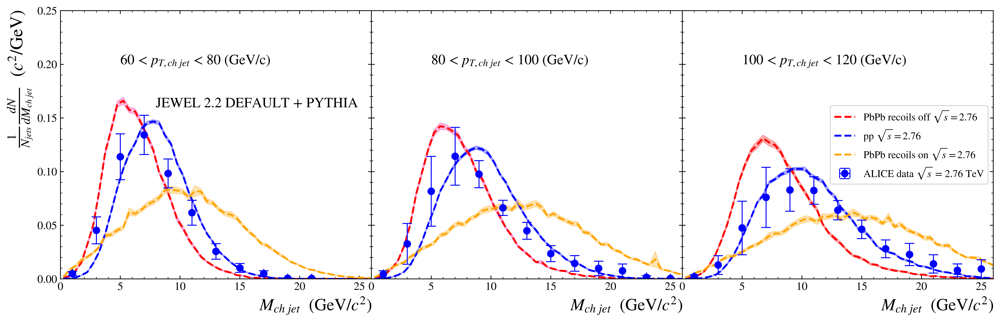

In [5]:
#GRÁFICOS PARA 2.76 JEWEL DEFAULT 

import yoda
import matplotlib.pyplot as plt
import numpy as np
import scipy as sc
from matplotlib.ticker import AutoMinorLocator
import os
import jetmass



#função para fazer o gráfico dos dados experimentais do ATLAS
def DataFromExperiment(file, scatter, min = 0, max = 0):
    '''
    Grab data from the Yoda.Scatter2D named scatter from the file yoda, following
    the method that colaborations (ALICE, ATLAS, CMS) save them.

    (str, str) -> (list(np.array))
    '''
    data = yoda.read(file)[scatter]

    if max == 0:
        max = len(data.xVals()) + 1

    x = np.asarray(data.xVals())[min:max]
    y = np.asarray(data.yVals())[min:max]
    err = np.asarray((data.yMaxs() - data.yMins()) / 2)[min:max]
    errx = np.asarray((data.xMaxs() - data.xMins()) / 2)[min:max]
    return [x, y, err, errx]






plt.style.use('plotconfig.mplstyle')


# Useful documentation:
# YODA: https://yoda.hepforge.org/pydoc/
# MATPLOTLIB: https://matplotlib.org/
# NUMPY: https://numpy.org/doc/

# Don't forget to load necessary packages in SAMPA
# source /cvmfs/alice.cern.ch/etc/login.sh
# eval `alienv printenv VO_ALICE@Rivet::2.7.2-alice2-1`




#Jewel 2.2 default PbPb recoils off 2.76
defaultreoff = '/home/monalisa/Desktop/Mestrado/JetMass/Matplotlib_jetmass/yoda_merge/simple_Pb_276_reoff_merge_R0.4.yoda'
#Jewel 2.2 vac pp recoils off 2.76
pp = '/home/monalisa/Desktop/Mestrado/JetMass/Matplotlib_jetmass/yoda_merge/pp_276_jetmass_merge_R0.4.yoda'
#Jewel 2.2 default PbPb recoils on 2.76
defaultreon = '/home/monalisa/Desktop/Mestrado/JetMass/Matplotlib_jetmass/yoda_merge/simple_Pb_276_reon_merge_R0.4.yoda'


obs = '/JET_MASS/Jet_Mass_60_80'

    
arr = jetmass.JM(defaultreoff, obs)
arrp = jetmass.JM(pp, obs)
arron = jetmass.JM(defaultreon, obs)






#ax1 = plt.subplot(131)
fig, (axs1, axs2, axs3) = plt.subplots(ncols=3, nrows=1, sharex=False, sharey=True,
                                       gridspec_kw={'hspace': 0, 'wspace': 0}, figsize=(15, 5), dpi = 800)




axs1.plot(arr[0], arr[1], color='r', linestyle='--', label='PbPb recoils off')
axs1.plot(arrp[0], arrp[1], color='b', linestyle='--', label='pp recoils off')
axs1.plot(arron[0], arron[1], color='orange', linestyle='--', label='PbPb recoils on')

axs1.fill_between(arr[0], arr[1]-arr[3], arr[1]+arr[3], color='deeppink', alpha=0.3)
axs1.fill_between(arrp[0], arrp[1]-arrp[3], arrp[1]+arrp[3], color='b', alpha=0.3)
axs1.fill_between(arron[0], arron[1]-arron[3], arron[1]+arron[3], color='orange', alpha=0.3)



# Define plot
#plt.axhline(y=1.0, xmin=0., xmax=1200., alpha=0.5, color='k', linestyle='--')
#plt.figure()



#Plot dos dados experimentais            
ALICE1 = DataFromExperiment('HEPData-ins1512107-v1-Table_4.yoda', '/REF/ALICE_2017_I1512107/d04-x01-y01')

axs1.errorbar(*ALICE1, color='b', fmt='o', ms=7, elinewidth = 1., capsize = 5, capthick = 1, label='ALICE data')            
#antes fmt='s'            





axs1.set_xlabel(r'$M_{ch~jet}$' '  (GeV/$c^{2}$)',  loc = 'right', fontsize=18)
axs1.set_ylabel(r'$\frac{1}{N_{jets}}\frac{dN}{dM_{ch~jet}}$' '  ($c^{2}$/GeV)', loc='top',  fontsize=19)
axs1.text(8., 0.16, 'JEWEL 2.2 DEFAULT + PYTHIA')
axs1.text(5., 0.2, '60 < $p_{T, ch~jet}}$ < 80 (GeV/c)')
#ax1.set_legend(loc=5)
axs1.set_xlim(0., 26.)
axs1.set_ylim(0., 0.25)
axs1.minorticks_on()




'''
Start the new plot for 80 < pt < 100
'''



obs2 = '/JET_MASS/Jet_Mass_80_100'

        

arr2 = jetmass.JM(defaultreoff, obs2)
arrp2 = jetmass.JM(pp, obs2)
arron2 = jetmass.JM(defaultreon, obs2)




axs2.plot(arr2[0], arr2[1], color='r', linestyle='--', label='PbPb recoils off')
axs2.plot(arrp2[0], arrp2[1], color='b', linestyle='--', label='pp recoils off')
axs2.plot(arron2[0], arron2[1], color='orange', linestyle='--', label='PbPb recoils on')

axs2.fill_between(arr2[0], arr2[1]-arr2[3], arr2[1]+arr2[3], color='deeppink', alpha=0.3)
axs2.fill_between(arrp2[0], arrp2[1]-arrp2[3], arrp2[1]+arrp2[3], color='b', alpha=0.3)
axs2.fill_between(arron2[0], arron2[1]-arron2[3], arron2[1]+arron2[3], color='orange', alpha=0.3)




#Plot dos dados experimentais            
ALICE2 = DataFromExperiment('HEPData-ins1512107-v1-Table_5.yoda', '/REF/ALICE_2017_I1512107/d05-x01-y01')

axs2.errorbar(*ALICE2, color='b', fmt='o', ms=7, elinewidth = 1., capsize = 5, capthick = 1, label='ALICE data')            
#antes fmt='s'  



axs2.set_xlabel(r'$M_{ch~jet}$' '  (GeV/$c^{2}$)', loc = 'right', fontsize=18)
#plt.ylabel(r'$\frac{1}{N_{jets}}\frac{dN}{dM_{ch~jet}}$' '  ($c^{2}$/GeV)', loc='top')
axs2.text(5., 0.2, '80 < $p_{T, ch~jet}}$ < 100 (GeV/c)')
#axs2.set_legend(loc=5)
axs2.set_xlim(0., 26.)
axs2.set_ylim(0., 0.25)
axs2.minorticks_on()




'''
Start the new plot for 100 < pt < 120
'''



obs3 = '/JET_MASS/Jet_Mass_100_120'



                

arr3 = jetmass.JM(defaultreoff, obs3)
arrp3 = jetmass.JM(pp, obs3)
arron3 = jetmass.JM(defaultreon, obs3)



axs3.plot(arr3[0], arr3[1], color='r', linestyle='--', label='PbPb recoils off $\sqrt{s}=2.76$')
axs3.plot(arrp3[0], arrp3[1], color='b', linestyle='--', label='pp $\sqrt{s}=2.76$')
axs3.plot(arron3[0], arron3[1], color='orange', linestyle='--', label='PbPb recoils on $\sqrt{s}=2.76$')

axs3.fill_between(arr3[0], arr3[1]-arr3[3], arr3[1]+arr3[3], color='r', alpha=0.3)
axs3.fill_between(arrp3[0], arrp3[1]-arrp3[3], arrp3[1]+arrp3[3], color='b', alpha=0.3)
axs3.fill_between(arron3[0], arron3[1]-arron3[3], arron3[1]+arron3[3], color='orange', alpha=0.3)




#Plot dos dados experimentais            
ALICE3 = DataFromExperiment('HEPData-ins1512107-v1-Table_6.yoda', '/REF/ALICE_2017_I1512107/d06-x01-y01')

axs3.errorbar(*ALICE3, color='b', fmt='o', ms=7, elinewidth = 1., capsize = 5, capthick = 1, label='ALICE data $\sqrt{s}$ = 2.76 TeV')            
#antes fmt='s'  




axs3.set_xlabel(r'$M_{ch~jet}$' '  (GeV/$c^{2}$)', loc = 'right',fontsize=18)
#axs3.set_ylabel(r'$\frac{1}{N_{jets}}\frac{dN}{dM_{ch~jet}}$' '  ($c^{2}$/GeV)', loc='top')
axs3.text(5., 0.2, '100 < $p_{T, ch~jet}}$ < 120 (GeV/c)')
plt.legend(loc=5)
axs3.set_xlim(0., 26.)
axs3.set_ylim(0., 0.25)
axs3.minorticks_on()



# Save
plt.savefig('Figures/2.76TeV/simple_jetmass_total_2760_R0.4_jewel_2.2.0.pdf')
plt.savefig('Figures/2.76TeV/simple_jetmass_total_2760_R0.4_jewel_2.2.0.png')


#Mostrar gráfico
plt.show()


In [7]:

#Graficos de todas as curvas em FLOW para 2.76 TeV 

import yoda
import matplotlib.pyplot as plt
import numpy as np
import scipy as sc
from matplotlib.ticker import AutoMinorLocator
import os
import jetmass



#função para fazer o gráfico dos dados experimentais do ATLAS
def DataFromExperiment(file, scatter, min = 0, max = 0):
    '''
    Grab data from the Yoda.Scatter2D named scatter from the file yoda, following
    the method that colaborations (ALICE, ATLAS, CMS) save them.

    (str, str) -> (list(np.array))
    '''
    data = yoda.read(file)[scatter]

    if max == 0:
        max = len(data.xVals()) + 1

    x = np.asarray(data.xVals())[min:max]
    y = np.asarray(data.yVals())[min:max]
    err = np.asarray((data.yMaxs() - data.yMins()) / 2)[min:max]
    errx = np.asarray((data.xMaxs() - data.xMins()) / 2)[min:max]
    return [x, y, err, errx]






plt.style.use('plotconfig.mplstyle')


# Useful documentation:
# YODA: https://yoda.hepforge.org/pydoc/
# MATPLOTLIB: https://matplotlib.org/
# NUMPY: https://numpy.org/doc/

# Don't forget to load necessary packages in SAMPA
# source /cvmfs/alice.cern.ch/etc/login.sh
# eval `alienv printenv VO_ALICE@Rivet::2.7.2-alice2-1`




#Jewel 2.2 FLOW PbPb recoils off 2.76
defaultreoff = '/home/monalisa/Desktop/Mestrado/JetMass/Matplotlib_jetmass/yoda_merge/flow_Pb_276_reoff_merge_R0.4.yoda'
#Jewel 2.2 vac pp recoils off 2.76
pp = '/home/monalisa/Desktop/Mestrado/JetMass/Matplotlib_jetmass/yoda_merge/pp_276_jetmass_merge_R0.4.yoda'

#Jewel 2.2 FLOW PbPb recoils on 2.76
defaultreon = '/home/monalisa/Desktop/Mestrado/JetMass/Matplotlib_jetmass/yoda_merge/flow_Pb_276_reon_merge_R0.4.yoda'

obs1 = '/JET_MASS/Jet_Mass_60_80'
obs = '/USPJWL_JET_MASS/Jet_Mass_60_80'

    
arr = jetmass.JM(defaultreoff, obs)
arrp = jetmass.JM(pp, obs)
arron = jetmass.JM(defaultreon, obs)






#ax1 = plt.subplot(131)
fig, (axs1, axs2, axs3) = plt.subplots(ncols=3, nrows=1, sharex=False, sharey=True,
                                       gridspec_kw={'hspace': 0, 'wspace': 0}, figsize=(15, 5), dpi = 800)




axs1.plot(arr[0], arr[1], color='deeppink', linestyle='--', label='PbPb recoils off')
axs1.plot(arrp[0], arrp[1], color='b', linestyle='--', label='pp')
axs1.plot(arron[0], arron[1], color='orangered', linestyle='--', label='PbPb recoils on')

axs1.fill_between(arr[0], arr[1]-arr[3], arr[1]+arr[3], color='deeppink', alpha=0.3)
axs1.fill_between(arrp[0], arrp[1]-arrp[3], arrp[1]+arrp[3], color='b', alpha=0.3)
axs1.fill_between(arron[0], arron[1]-arron[3], arron[1]+arron[3], color='orangered', alpha=0.3)


# Define plot
#plt.axhline(y=1.0, xmin=0., xmax=1200., alpha=0.5, color='k', linestyle='--')
#plt.figure()



#Plot dos dados experimentais            
ALICE1 = DataFromExperiment('HEPData-ins1512107-v1-Table_4.yoda', '/REF/ALICE_2017_I1512107/d04-x01-y01')

axs1.errorbar(*ALICE1, color='b', fmt='o', ms=7, elinewidth = 1., capsize = 5, capthick = 1, label='ALICE data')            
#antes fmt='s'            





axs1.set_xlabel(r'$M_{ch~jet}$' '  (GeV/$c^{2}$)',  loc = 'right', fontsize=18)
axs1.set_ylabel(r'$\frac{1}{N_{jets}}\frac{dN}{dM_{ch~jet}}$' '  ($c^{2}$/GeV)', loc='top',  fontsize=19)
axs1.text(8., 0.16, 'JEWEL 2.2 FLOW + PYTHIA')
axs1.text(5., 0.2, '60 < $p_{T, ch~jet}}$ < 80 (GeV/c)')
#ax1.set_legend(loc=5)
axs1.set_xlim(0., 26.)
axs1.set_ylim(0., 0.25)
axs1.minorticks_on()




'''
Start the new plot for 80 < pt < 100
'''



obs2 = '/USPJWL_JET_MASS/Jet_Mass_80_100'

        

arr2 = jetmass.JM(defaultreoff, obs2)
arrp2 = jetmass.JM(pp, obs2)
arron2 = jetmass.JM(defaultreon, obs2)




axs2.plot(arr2[0], arr2[1], color='deeppink', linestyle='--', label='PbPb recoils off')
axs2.plot(arrp2[0], arrp2[1], color='b', linestyle='--', label='pp')
axs2.plot(arron2[0], arron2[1], color='orangered', linestyle='--', label='PbPb recoils on')

axs2.fill_between(arr2[0], arr2[1]-arr2[3], arr2[1]+arr2[3], color='deeppink', alpha=0.3)
axs2.fill_between(arrp2[0], arrp2[1]-arrp2[3], arrp2[1]+arrp2[3], color='b', alpha=0.3)
axs2.fill_between(arron2[0], arron2[1]-arron2[3], arron2[1]+arron2[3], color='orangered', alpha=0.3)


#Plot dos dados experimentais            
ALICE2 = DataFromExperiment('HEPData-ins1512107-v1-Table_5.yoda', '/REF/ALICE_2017_I1512107/d05-x01-y01')

axs2.errorbar(*ALICE2, color='b', fmt='o', ms=7, elinewidth = 1., capsize = 5, capthick = 1, label='ALICE data')            
#antes fmt='s'  



axs2.set_xlabel(r'$M_{ch~jet}$' '  (GeV/$c^{2}$)', loc = 'right', fontsize=18)
#plt.ylabel(r'$\frac{1}{N_{jets}}\frac{dN}{dM_{ch~jet}}$' '  ($c^{2}$/GeV)', loc='top')
axs2.text(5., 0.2, '80 < $p_{T, ch~jet}}$ < 100 (GeV/c)')
#axs2.set_legend(loc=5)
axs2.set_xlim(0., 26.)
axs2.set_ylim(0., 0.25)
axs2.minorticks_on()




'''
Start the new plot for 100 < pt < 120
'''



obs3 = '/USPJWL_JET_MASS/Jet_Mass_100_120'



                

arr3 = jetmass.JM(defaultreoff, obs3)
arrp3 = jetmass.JM(pp, obs3)
arron3 = jetmass.JM(defaultreon, obs3)



axs3.plot(arr3[0], arr3[1], color='deeppink', linestyle='--', label='PbPb recoils off $\sqrt{s}=2.76$')
axs3.plot(arrp3[0], arrp3[1], color='b', linestyle='--', label='pp $\sqrt{s}=2.76$')
axs3.plot(arron3[0], arron3[1], color='orangered', linestyle='--', label='PbPb recoils on $\sqrt{s}=2.76$')

axs3.fill_between(arr3[0], arr3[1]-arr3[3], arr3[1]+arr3[3], color='deeppink', alpha=0.3)
axs3.fill_between(arrp3[0], arrp3[1]-arrp3[3], arrp3[1]+arrp3[3], color='b', alpha=0.3)
axs3.fill_between(arron3[0], arron3[1]-arron3[3], arron3[1]+arron3[3], color='orangered', alpha=0.3)


#Plot dos dados experimentais            
ALICE3 = DataFromExperiment('HEPData-ins1512107-v1-Table_6.yoda', '/REF/ALICE_2017_I1512107/d06-x01-y01')

axs3.errorbar(*ALICE3, color='b', fmt='o', ms=7, elinewidth = 1., capsize = 5, capthick = 1, label='ALICE data $\sqrt{s}$ = 2.76 TeV')            
#antes fmt='s'  




axs3.set_xlabel(r'$M_{ch~jet}$' '  (GeV/$c^{2}$)', loc = 'right',fontsize=18)
#axs3.set_ylabel(r'$\frac{1}{N_{jets}}\frac{dN}{dM_{ch~jet}}$' '  ($c^{2}$/GeV)', loc='top')
axs3.text(5., 0.2, '100 < $p_{T, ch~jet}}$ < 120 (GeV/c)')
plt.legend(loc=5)
axs3.set_xlim(0., 26.)
axs3.set_ylim(0., 0.25)
axs3.minorticks_on()



# Save
plt.savefig('Figures/2.76TeV/flow_jetmass_total_2760_R0.4_jewel_2.2.0.pdf')
plt.savefig('Figures/2.76TeV/flow_jetmass_total_2760_R0.4_jewel_2.2.0.png')


#Mostrar gráfico
plt.show()

KeyError: '/USPJWL_JET_MASS/Jet_Mass_60_80'

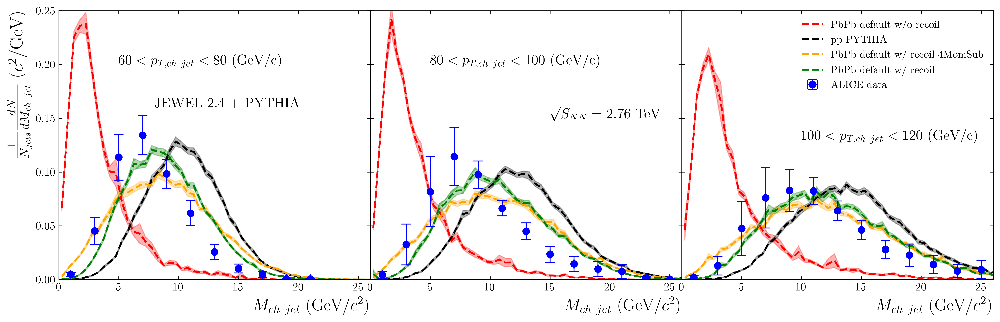

In [2]:
#GRÁFICOS PARA 2.76 JEWEL 2.4 DEFAULT

import yoda
import matplotlib.pyplot as plt
import numpy as np
import scipy as sc
#from matplotlib.ticker import AutoMinorLocator
import os
import jetmass



#função para fazer o gráfico dos dados experimentais do ATLAS
def DataFromExperiment(file, scatter, min = 0, max = 0):
    '''
    Grab data from the Yoda.Scatter2D named scatter from the file yoda, following
    the method that colaborations (ALICE, ATLAS, CMS) save them.

    (str, str) -> (list(np.array))
    '''
    data = yoda.read(file)[scatter]

    if max == 0:
        max = len(data.xVals()) + 1

    x = np.asarray(data.xVals())[min:max]
    y = np.asarray(data.yVals())[min:max]
    err = np.asarray((data.yMaxs() - data.yMins()) / 2)[min:max]
    errx = np.asarray((data.xMaxs() - data.xMins()) / 2)[min:max]
    return [x, y, err, errx]






plt.style.use('plotconfig.mplstyle')


# Useful documentation:
# YODA: https://yoda.hepforge.org/pydoc/
# MATPLOTLIB: https://matplotlib.org/
# NUMPY: https://numpy.org/doc/

# Don't forget to load necessary packages in SAMPA
# source /cvmfs/alice.cern.ch/etc/login.sh
# eval `alienv printenv VO_ALICE@Rivet::2.7.2-alice2-1`




#Jewel 2.4 default PbPb recoils off 2.76
#defaultreoff = '/home/monalisa/Desktop/Mestrado/JetMass/Matplotlib_jetmass/yoda_merge/2002_simple_jewel2.4_jetmass_reoff_R0.4.yoda'
defaultreoff = '/home/monalisa/Desktop/Mestrado/JetMass/Matplotlib_jetmass/yoda_merge/simple_1603_jewel2.4_reoff_jetmass_R0.4.yoda'

#Jewel 2.4 default PbPb recoils on 2.76 new subtract
#defaultreon2 = '/home/monalisa/Desktop/Mestrado/JetMass/Matplotlib_jetmass/yoda_merge/simple_0703_jewel2.4_jetmass_reon_R0.4.yoda'
defaultreon2 = '/home/monalisa/Desktop/Mestrado/JetMass/Matplotlib_jetmass/yoda_merge/simple_1603_jewel2.4_reon_jetmass_R0.4.yoda'
#defaultreon2 = '/home/monalisa/Desktop/Mestrado/JetMass/Matplotlib_jetmass/yoda_merge/simple_2202_jewel2.4_jetmass_reon_R0.4.yoda'

#Jewel 2.4 vac pp recoils off 2.76
#pp = '/home/monalisa/Desktop/Mestrado/JetMass/Matplotlib_jetmass/yoda_merge/pp_0303_jewel2.4_jetmass_R0.4.yoda'
pp = '/home/monalisa/Desktop/Mestrado/JetMass/Matplotlib_jetmass/yoda_merge/pp_1503_jewel2.4_simple_jetmass_R0.4.yoda'
#Jewel 2.4 default PbPb recoils on 2.76
defaultreon = '/home/monalisa/Desktop/Mestrado/JetMass/Matplotlib_jetmass/yoda_merge/simple_jewel2.4_4MomSub_Pb_276_reon_merge_R0.4.yoda'

obs = '/JET_MASS/Jet_Mass_60_80'
obs1 = '/USPJWL_JET_MASS/Jet_Mass_60_80'

    
arr = jetmass.JM(defaultreoff, obs1)
arrp = jetmass.JM(pp, obs1)
arron = jetmass.JM(defaultreon, obs)
arronn = jetmass.JM(defaultreon2, obs1)





#ax1 = plt.subplot(131)
fig, (axs1, axs2, axs3) = plt.subplots(ncols=3, nrows=1, sharex=False, sharey=True,
                                       gridspec_kw={'hspace': 0, 'wspace': 0}, figsize=(15, 5), dpi = 600)




axs1.plot(arr[0], arr[1], color='r', linestyle='--', label='PbPb default')
axs1.plot(arrp[0], arrp[1], color='black', linestyle='--', label='pp recoils off')
axs1.plot(arron[0], arron[1], color='orange', linestyle='--', label='PbPb recoils on')
axs1.plot(arronn[0], arronn[1], color='green', linestyle='--', label='PbPb default')


axs1.fill_between(arr[0], arr[1]-arr[3], arr[1]+arr[3], color='r', alpha=0.3)
axs1.fill_between(arrp[0], arrp[1]-arrp[3], arrp[1]+arrp[3], color='black', alpha=0.3)
axs1.fill_between(arron[0], arron[1]-arron[3], arron[1]+arron[3], color='orange', alpha=0.3)
axs1.fill_between(arronn[0], arronn[1]-arronn[3], arronn[1]+arronn[3], color='green', alpha=0.3, hatch='//')



# Define plot
#plt.axhline(y=1.0, xmin=0., xmax=1200., alpha=0.5, color='k', linestyle='--')
#plt.figure()



#Plot dos dados experimentais            
ALICE1 = DataFromExperiment('HEPData-ins1512107-v1-Table_4.yoda', '/REF/ALICE_2017_I1512107/d04-x01-y01')

axs1.errorbar(*ALICE1, color='b', fmt='o', ms=7, elinewidth = 1., capsize = 5, capthick = 1, label='ALICE data')            
#antes fmt='s'            





axs1.set_xlabel(r'$M_{ch~jet}$' '  (GeV/$c^{2}$)',  loc = 'right', fontsize=18)
axs1.set_ylabel(r'$\frac{1}{N_{jets}}\frac{dN}{dM_{ch~jet}}$' '  ($c^{2}$/GeV)', loc='top',  fontsize=19)
axs1.text(8., 0.16, 'JEWEL 2.4 + PYTHIA')
axs1.text(5., 0.2, '$60 < p_{T, ch~jet} < 80$ (GeV/c)')
#ax1.set_legend(loc=5)
axs1.set_xlim(0., 26.)
axs1.set_ylim(0., 0.25)
#axs1.minorticks_on()




'''
Start the new plot for 80 < pt < 100
'''


obs2 = '/JET_MASS/Jet_Mass_80_100'
obs21 = '/USPJWL_JET_MASS/Jet_Mass_80_100'

        

arr2 = jetmass.JM(defaultreoff, obs21)
arrp2 = jetmass.JM(pp, obs21)
arron2 = jetmass.JM(defaultreon, obs2)
arron2n = jetmass.JM(defaultreon2, obs21)




axs2.plot(arr2[0], arr2[1], color='r', linestyle='--', label='PbPb default')
axs2.plot(arrp2[0], arrp2[1], color='black', linestyle='--', label='pp recoils off')
axs2.plot(arron2[0], arron2[1], color='orange', linestyle='--', label='PbPb recoils on')
axs2.plot(arron2n[0], arron2n[1], color='green', linestyle='--', label='PbPb default')




axs2.fill_between(arr2[0], arr2[1]-arr2[3], arr2[1]+arr2[3], color='r', alpha=0.3)
axs2.fill_between(arrp2[0], arrp2[1]-arrp2[3], arrp2[1]+arrp2[3], color='black', alpha=0.3)
axs2.fill_between(arron2[0], arron2[1]-arron2[3], arron2[1]+arron2[3], color='orange', alpha=0.3)
axs2.fill_between(arron2n[0], arron2n[1]-arron2n[3], arron2n[1]+arron2n[3], color='green', alpha=0.3, hatch='//')




#Plot dos dados experimentais            
ALICE2 = DataFromExperiment('HEPData-ins1512107-v1-Table_5.yoda', '/REF/ALICE_2017_I1512107/d05-x01-y01')

axs2.errorbar(*ALICE2, color='b', fmt='o', ms=7, elinewidth = 1., capsize = 5, capthick = 1, label='ALICE data')            
#antes fmt='s'  



axs2.set_xlabel(r'$M_{ch~jet}$' '  (GeV/$c^{2}$)', loc = 'right', fontsize=18)
#plt.ylabel(r'$\frac{1}{N_{jets}}\frac{dN}{dM_{ch~jet}}$' '  ($c^{2}$/GeV)', loc='top')
axs2.text(5., 0.2, '$80 < p_{T, ch~jet} < 100$ (GeV/c)')
axs2.text(15., 0.15, '$\sqrt{S_{NN}} = 2.76 $ TeV')
#axs2.text(12., 0.12, 'WRITEDUMMIES = F')
#axs2.set_legend(loc=5)
axs2.set_xlim(0., 26.)
axs2.set_ylim(0., 0.25)
#axs2.minorticks_on()




'''
Start the new plot for 100 < pt < 120
'''


obs3 = '/JET_MASS/Jet_Mass_100_120'
obs31 = '/USPJWL_JET_MASS/Jet_Mass_100_120'



                

arr3 = jetmass.JM(defaultreoff, obs31)
arrp3 = jetmass.JM(pp, obs31)
arron3 = jetmass.JM(defaultreon, obs3)
arron3n = jetmass.JM(defaultreon2, obs31)



axs3.plot(arr3[0], arr3[1], color='r', linestyle='--', label='PbPb default w/o recoil')
axs3.plot(arrp3[0], arrp3[1], color='black', linestyle='--', label='pp PYTHIA')
axs3.plot(arron3[0], arron3[1], color='orange', linestyle='--', label='PbPb default w/ recoil 4MomSub')
axs3.plot(arron3n[0], arron3n[1], color='green', linestyle='--', label='PbPb default w/ recoil')


axs3.fill_between(arr3[0], arr3[1]-arr3[3], arr3[1]+arr3[3], color='r', alpha=0.3)
axs3.fill_between(arrp3[0], arrp3[1]-arrp3[3], arrp3[1]+arrp3[3], color='black', alpha=0.3)
axs3.fill_between(arron3[0], arron3[1]-arron3[3], arron3[1]+arron3[3], color='orange', alpha=0.3)
axs3.fill_between(arron3n[0], arron3n[1]-arron3n[3], arron3n[1]+arron3n[3], color='green', alpha=0.3, hatch='//')




#Plot dos dados experimentais            
ALICE3 = DataFromExperiment('HEPData-ins1512107-v1-Table_6.yoda', '/REF/ALICE_2017_I1512107/d06-x01-y01')

axs3.errorbar(*ALICE3, color='b', fmt='o', ms=7, elinewidth = 1., capsize = 5, capthick = 1, label='ALICE data')            
#antes fmt='s'  




axs3.set_xlabel(r'$M_{ch~jet}$' '  (GeV/$c^{2}$)', loc = 'right',fontsize=18)
#axs3.set_ylabel(r'$\frac{1}{N_{jets}}\frac{dN}{dM_{ch~jet}}$' '  ($c^{2}$/GeV)', loc='top')
axs3.text(10., 0.13, '$100 < p_{T, ch~jet} < 120$' ' (GeV/c)')
plt.legend(loc=1)
axs3.set_xlim(0., 26.)
axs3.set_ylim(0., 0.25)
#axs3.minorticks_on()



# Save
plt.savefig('Figures/2.76TeV/simple_jewel2.4_jetmass_2760_R0.4_dummies.pdf')
plt.savefig('Figures/2.76TeV/simple_jewel2.4_jetmass_2760_R0.4_dummies.png')


#Mostrar gráfico
plt.show()


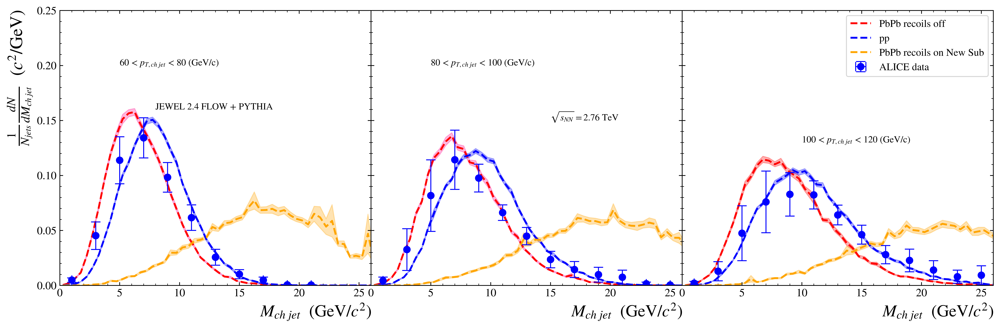

In [2]:
#GRÁFICOS PARA 2.76 JEWEL 2.4 FLOW

import yoda
import matplotlib.pyplot as plt
import numpy as np
import scipy as sc
from matplotlib.ticker import AutoMinorLocator
import os
import jetmass



#função para fazer o gráfico dos dados experimentais do ATLAS
def DataFromExperiment(file, scatter, min = 0, max = 0):
    '''
    Grab data from the Yoda.Scatter2D named scatter from the file yoda, following
    the method that colaborations (ALICE, ATLAS, CMS) save them.

    (str, str) -> (list(np.array))
    '''
    data = yoda.read(file)[scatter]

    if max == 0:
        max = len(data.xVals()) + 1

    x = np.asarray(data.xVals())[min:max]
    y = np.asarray(data.yVals())[min:max]
    err = np.asarray((data.yMaxs() - data.yMins()) / 2)[min:max]
    errx = np.asarray((data.xMaxs() - data.xMins()) / 2)[min:max]
    return [x, y, err, errx]






plt.style.use('plotconfig.mplstyle')


# Useful documentation:
# YODA: https://yoda.hepforge.org/pydoc/
# MATPLOTLIB: https://matplotlib.org/
# NUMPY: https://numpy.org/doc/

# Don't forget to load necessary packages in SAMPA
# source /cvmfs/alice.cern.ch/etc/login.sh
# eval `alienv printenv VO_ALICE@Rivet::2.7.2-alice2-1`




#Jewel 2.4 default PbPb recoils off 2.76
#defaultreoff = '/home/monalisa/Desktop/Mestrado/JetMass/Matplotlib_jetmass/yoda_merge/2002_simple_jewel2.4_jetmass_reoff_R0.4.yoda'
defaultreoff = '/home/monalisa/Desktop/Mestrado/JetMass/Matplotlib_jetmass/yoda_merge/flow_0303_jewel2.4_jetmass_reoff_R0.4.yoda'

#Jewel 2.4 default PbPb recoils on 2.76 new subtract
defaultreon2 = '/home/monalisa/Desktop/Mestrado/JetMass/Matplotlib_jetmass/yoda_merge/flow_0303_jewel2.4_jetmass_reon_R0.4.yoda'
#Jewel 2.4 vac pp recoils off 2.76
pp = '/home/monalisa/Desktop/Mestrado/JetMass/Matplotlib_jetmass/yoda_merge/pp_jewel2.4_276_merge_R0.4.yoda'
#Jewel 2.4 default PbPb recoils on 2.76
defaultreon = '/home/monalisa/Desktop/Mestrado/JetMass/Matplotlib_jetmass/yoda_merge/simple_jewel2.4_4MomSub_Pb_276_reon_merge_R0.4.yoda'


obs = '/JET_MASS/Jet_Mass_60_80'

    
arr = jetmass.JM(defaultreoff, obs)
arrp = jetmass.JM(pp, obs)
arron = jetmass.JM(defaultreon, obs)
arronn = jetmass.JM(defaultreon2, obs)






#ax1 = plt.subplot(131)
fig, (axs1, axs2, axs3) = plt.subplots(ncols=3, nrows=1, sharex=False, sharey=True,
                                       gridspec_kw={'hspace': 0, 'wspace': 0}, figsize=(15, 5), dpi = 800)




axs1.plot(arr[0], arr[1], color='r', linestyle='--', label='PbPb recoils off')
axs1.plot(arrp[0], arrp[1], color='b', linestyle='--', label='pp recoils off')
#axs1.plot(arron[0], arron[1], color='limegreen', linestyle='--', label='PbPb recoils on')
axs1.plot(arronn[0], arronn[1], color='orange', linestyle='--', label='PbPb recoils on')


axs1.fill_between(arr[0], arr[1]-arr[3], arr[1]+arr[3], color='deeppink', alpha=0.3)
axs1.fill_between(arrp[0], arrp[1]-arrp[3], arrp[1]+arrp[3], color='b', alpha=0.3)
#axs1.fill_between(arron[0], arron[1]-arron[3], arron[1]+arron[3], color='limegreen', alpha=0.3)
axs1.fill_between(arronn[0], arronn[1]-arronn[3], arronn[1]+arronn[3], color='orange', alpha=0.3)



# Define plot
#plt.axhline(y=1.0, xmin=0., xmax=1200., alpha=0.5, color='k', linestyle='--')
#plt.figure()



#Plot dos dados experimentais            
ALICE1 = DataFromExperiment('HEPData-ins1512107-v1-Table_4.yoda', '/REF/ALICE_2017_I1512107/d04-x01-y01')

axs1.errorbar(*ALICE1, color='b', fmt='o', ms=7, elinewidth = 1., capsize = 5, capthick = 1, label='ALICE data')            
#antes fmt='s'            





axs1.set_xlabel(r'$M_{ch~jet}$' '  (GeV/$c^{2}$)',  loc = 'right', fontsize=18)
axs1.set_ylabel(r'$\frac{1}{N_{jets}}\frac{dN}{dM_{ch~jet}}$' '  ($c^{2}$/GeV)', loc='top',  fontsize=19)
axs1.text(8., 0.16, 'JEWEL 2.4 FLOW + PYTHIA')
axs1.text(5., 0.2, '60 < $p_{T, ch~jet}}$ < 80 (GeV/c)')
#ax1.set_legend(loc=5)
axs1.set_xlim(0., 26.)
axs1.set_ylim(0., 0.25)
axs1.minorticks_on()




'''
Start the new plot for 80 < pt < 100
'''



obs2 = '/JET_MASS/Jet_Mass_80_100'

        

arr2 = jetmass.JM(defaultreoff, obs2)
arrp2 = jetmass.JM(pp, obs2)
arron2 = jetmass.JM(defaultreon, obs2)
arron2n = jetmass.JM(defaultreon2, obs2)




axs2.plot(arr2[0], arr2[1], color='r', linestyle='--', label='PbPb recoils off')
axs2.plot(arrp2[0], arrp2[1], color='b', linestyle='--', label='pp recoils off')
#axs2.plot(arron2[0], arron2[1], color='limegreen', linestyle='--', label='PbPb recoils on')
axs2.plot(arron2n[0], arron2n[1], color='orange', linestyle='--', label='PbPb recoils on')




axs2.fill_between(arr2[0], arr2[1]-arr2[3], arr2[1]+arr2[3], color='deeppink', alpha=0.3)
axs2.fill_between(arrp2[0], arrp2[1]-arrp2[3], arrp2[1]+arrp2[3], color='b', alpha=0.3)
#axs2.fill_between(arron2[0], arron2[1]-arron2[3], arron2[1]+arron2[3], color='limegreen', alpha=0.3)
axs2.fill_between(arron2n[0], arron2n[1]-arron2n[3], arron2n[1]+arron2n[3], color='orange', alpha=0.3)




#Plot dos dados experimentais            
ALICE2 = DataFromExperiment('HEPData-ins1512107-v1-Table_5.yoda', '/REF/ALICE_2017_I1512107/d05-x01-y01')

axs2.errorbar(*ALICE2, color='b', fmt='o', ms=7, elinewidth = 1., capsize = 5, capthick = 1, label='ALICE data')            
#antes fmt='s'  



axs2.set_xlabel(r'$M_{ch~jet}$' '  (GeV/$c^{2}$)', loc = 'right', fontsize=18)
#plt.ylabel(r'$\frac{1}{N_{jets}}\frac{dN}{dM_{ch~jet}}$' '  ($c^{2}$/GeV)', loc='top')
axs2.text(5., 0.2, '80 < $p_{T, ch~jet}}$ < 100 (GeV/c)')
axs2.text(15., 0.15, '$\sqrt{s_{NN}} = 2.76$ TeV')

#axs2.set_legend(loc=5)
axs2.set_xlim(0., 26.)
axs2.set_ylim(0., 0.25)
axs2.minorticks_on()




'''
Start the new plot for 100 < pt < 120
'''



obs3 = '/JET_MASS/Jet_Mass_100_120'



                

arr3 = jetmass.JM(defaultreoff, obs3)
arrp3 = jetmass.JM(pp, obs3)
arron3 = jetmass.JM(defaultreon, obs3)
arron3n = jetmass.JM(defaultreon2, obs3)



axs3.plot(arr3[0], arr3[1], color='r', linestyle='--', label='PbPb recoils off')
axs3.plot(arrp3[0], arrp3[1], color='b', linestyle='--', label='pp')
#axs3.plot(arron3[0], arron3[1], color='limegreen', linestyle='--', label='PbPb recoils on 4MomSub $\sqrt{s}=2.76$')
axs3.plot(arron3n[0], arron3n[1], color='orange', linestyle='--', label='PbPb recoils on New Sub')


axs3.fill_between(arr3[0], arr3[1]-arr3[3], arr3[1]+arr3[3], color='r', alpha=0.3)
axs3.fill_between(arrp3[0], arrp3[1]-arrp3[3], arrp3[1]+arrp3[3], color='b', alpha=0.3)
#axs3.fill_between(arron3[0], arron3[1]-arron3[3], arron3[1]+arron3[3], color='limegreen', alpha=0.3)
axs3.fill_between(arron3n[0], arron3n[1]-arron3n[3], arron3n[1]+arron3n[3], color='orange', alpha=0.3)




#Plot dos dados experimentais            
ALICE3 = DataFromExperiment('HEPData-ins1512107-v1-Table_6.yoda', '/REF/ALICE_2017_I1512107/d06-x01-y01')

axs3.errorbar(*ALICE3, color='b', fmt='o', ms=7, elinewidth = 1., capsize = 5, capthick = 1, label='ALICE data')            
#antes fmt='s'  




axs3.set_xlabel(r'$M_{ch~jet}$' '  (GeV/$c^{2}$)', loc = 'right',fontsize=18)
#axs3.set_ylabel(r'$\frac{1}{N_{jets}}\frac{dN}{dM_{ch~jet}}$' '  ($c^{2}$/GeV)', loc='top')
axs3.text(10., 0.13, '100 < $p_{T, ch~jet}}$ < 120 (GeV/c)')
plt.legend(loc=1)
axs3.set_xlim(0., 26.)
axs3.set_ylim(0., 0.25)
axs3.minorticks_on()



# Save
plt.savefig('Figures/2.76TeV/flow_jewel2.4_jetmass_2760_R0.4.pdf')
#plt.savefig('Figures/2.76TeV/flow_jewel2.4_jetmass_total_2760_R0.4.png')


#Mostrar gráfico
plt.show()


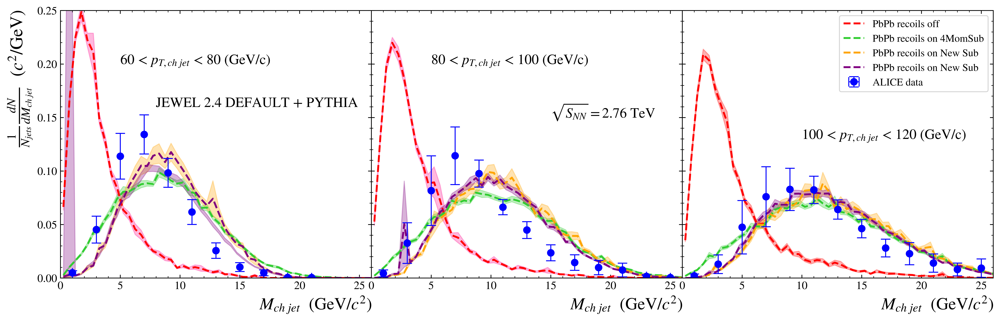

In [5]:
#Teste - comparações

import yoda
import matplotlib.pyplot as plt
import numpy as np
import scipy as sc
from matplotlib.ticker import AutoMinorLocator
import os
import jetmass



#função para fazer o gráfico dos dados experimentais do ATLAS
def DataFromExperiment(file, scatter, min = 0, max = 0):
    '''
    Grab data from the Yoda.Scatter2D named scatter from the file yoda, following
    the method that colaborations (ALICE, ATLAS, CMS) save them.

    (str, str) -> (list(np.array))
    '''
    data = yoda.read(file)[scatter]

    if max == 0:
        max = len(data.xVals()) + 1

    x = np.asarray(data.xVals())[min:max]
    y = np.asarray(data.yVals())[min:max]
    err = np.asarray((data.yMaxs() - data.yMins()) / 2)[min:max]
    errx = np.asarray((data.xMaxs() - data.xMins()) / 2)[min:max]
    return [x, y, err, errx]






plt.style.use('plotconfig.mplstyle')


# Useful documentation:
# YODA: https://yoda.hepforge.org/pydoc/
# MATPLOTLIB: https://matplotlib.org/
# NUMPY: https://numpy.org/doc/

# Don't forget to load necessary packages in SAMPA
# source /cvmfs/alice.cern.ch/etc/login.sh
# eval `alienv printenv VO_ALICE@Rivet::2.7.2-alice2-1`




#Jewel 2.4 default PbPb recoils off 2.76
#defaultreoff = '/home/monalisa/Desktop/Mestrado/JetMass/Matplotlib_jetmass/yoda_merge/2002_simple_jewel2.4_jetmass_reoff_R0.4.yoda'
defaultreoff = '/home/monalisa/Desktop/Mestrado/JetMass/Matplotlib_jetmass/yoda_merge/simple_0703_jewel2.4_jetmass_reoff_R0.4.yoda'

#Jewel 2.4 default PbPb recoils on 2.76 new subtract
defaultreon3 = '/home/monalisa/Desktop/Mestrado/JetMass/Matplotlib_jetmass/yoda_merge/simple_0703_jewel2.4_jetmass_reon_R0.4.yoda'
defaultreon2 = '/home/monalisa/Desktop/Mestrado/JetMass/Matplotlib_jetmass/yoda_merge/0-10_mass.yoda'
#defaultreon2 = '/home/monalisa/Desktop/Mestrado/JetMass/Matplotlib_jetmass/yoda_merge/simple_2202_jewel2.4_jetmass_reon_R0.4.yoda'

#Jewel 2.4 vac pp recoils off 2.76
#pp = '/home/monalisa/Desktop/Mestrado/JetMass/Matplotlib_jetmass/yoda_merge/pp_0303_jewel2.4_jetmass_R0.4.yoda'
pp = '/home/monalisa/Desktop/Mestrado/JetMass/Matplotlib_jetmass/yoda_merge/pp_1003_jewel2.41_jetmass_R0.4.yoda'
#Jewel 2.4 default PbPb recoils on 2.76
defaultreon = '/home/monalisa/Desktop/Mestrado/JetMass/Matplotlib_jetmass/yoda_merge/simple_jewel2.4_4MomSub_Pb_276_reon_merge_R0.4.yoda'

obs = '/JET_MASS/Jet_Mass_60_80'
obs1 = '/USPJWL_JET_MASS/Jet_Mass_60_80'

    
arr = jetmass.JM(defaultreoff, obs)
arrp = jetmass.JM(pp, obs1)
arron = jetmass.JM(defaultreon, obs)
arronn = jetmass.JM(defaultreon2, obs)
arronn3 = jetmass.JM(defaultreon3, obs)






#ax1 = plt.subplot(131)
fig, (axs1, axs2, axs3) = plt.subplots(ncols=3, nrows=1, sharex=False, sharey=True,
                                       gridspec_kw={'hspace': 0, 'wspace': 0}, figsize=(15, 5), dpi = 800)







axs1.plot(arr[0], arr[1], color='r', linestyle='--', label='PbPb recoils off')
#axs1.plot(arrp[0], arrp[1], color='b', linestyle='--', label='pp recoils off')
axs1.plot(arron[0], arron[1], color='limegreen', linestyle='--', label='PbPb recoils on')
axs1.plot(arronn[0], arronn[1], color='orange', linestyle='--', label='PbPb recoils on')
axs1.plot(arronn3[0], arronn[1], color='purple', linestyle='--', label='PbPb recoils on')



axs1.fill_between(arr[0], arr[1]-arr[3], arr[1]+arr[3], color='deeppink', alpha=0.3)
#axs1.fill_between(arrp[0], arrp[1]-arrp[3], arrp[1]+arrp[3], color='b', alpha=0.3)
axs1.fill_between(arron[0], arron[1]-arron[3], arron[1]+arron[3], color='limegreen', alpha=0.3)
axs1.fill_between(arronn[0], arronn[1]-arronn[3], arronn[1]+arronn[3], color='orange', alpha=0.3)
axs1.fill_between(arronn3[0], arronn3[1]-arronn3[3], arronn3[1]+arronn3[3], color='purple', alpha=0.3)




# Define plot
#plt.axhline(y=1.0, xmin=0., xmax=1200., alpha=0.5, color='k', linestyle='--')
#plt.figure()



#Plot dos dados experimentais            
ALICE1 = DataFromExperiment('HEPData-ins1512107-v1-Table_4.yoda', '/REF/ALICE_2017_I1512107/d04-x01-y01')

axs1.errorbar(*ALICE1, color='b', fmt='o', ms=7, elinewidth = 1., capsize = 5, capthick = 1, label='ALICE data')            
#antes fmt='s'            





axs1.set_xlabel(r'$M_{ch~jet}$' '  (GeV/$c^{2}$)',  loc = 'right', fontsize=18)
axs1.set_ylabel(r'$\frac{1}{N_{jets}}\frac{dN}{dM_{ch~jet}}$' '  ($c^{2}$/GeV)', loc='top',  fontsize=19)
axs1.text(8., 0.16, 'JEWEL 2.4 DEFAULT + PYTHIA')
axs1.text(5., 0.2, '60 < $p_{T, ch~jet}}$ < 80 (GeV/c)')
#ax1.set_legend(loc=5)
axs1.set_xlim(0., 26.)
axs1.set_ylim(0., 0.25)
axs1.minorticks_on()




'''
Start the new plot for 80 < pt < 100
'''


obs2 = '/JET_MASS/Jet_Mass_80_100'
obs21 = '/USPJWL_JET_MASS/Jet_Mass_80_100'

        

arr2 = jetmass.JM(defaultreoff, obs2)
arrp2 = jetmass.JM(pp, obs21)
arron2 = jetmass.JM(defaultreon, obs2)
arron2n = jetmass.JM(defaultreon2, obs2)
arron3n = jetmass.JM(defaultreon3, obs2)





axs2.plot(arr2[0], arr2[1], color='r', linestyle='--', label='PbPb recoils off')
#axs2.plot(arrp2[0], arrp2[1], color='b', linestyle='--', label='pp recoils off')
axs2.plot(arron2[0], arron2[1], color='limegreen', linestyle='--', label='PbPb recoils on')
axs2.plot(arron2n[0], arron2n[1], color='orange', linestyle='--', label='PbPb recoils on')
axs2.plot(arron3n[0], arron3n[1], color='purple', linestyle='--', label='PbPb recoils on')




axs2.fill_between(arr2[0], arr2[1]-arr2[3], arr2[1]+arr2[3], color='deeppink', alpha=0.3)
#axs2.fill_between(arrp2[0], arrp2[1]-arrp2[3], arrp2[1]+arrp2[3], color='b', alpha=0.3)
axs2.fill_between(arron2[0], arron2[1]-arron2[3], arron2[1]+arron2[3], color='limegreen', alpha=0.3)
axs2.fill_between(arron2n[0], arron2n[1]-arron2n[3], arron2n[1]+arron2n[3], color='orange', alpha=0.3)
axs2.fill_between(arron3n[0], arron3n[1]-arron3n[3], arron3n[1]+arron3n[3], color='purple', alpha=0.3)




#Plot dos dados experimentais            
ALICE2 = DataFromExperiment('HEPData-ins1512107-v1-Table_5.yoda', '/REF/ALICE_2017_I1512107/d05-x01-y01')

axs2.errorbar(*ALICE2, color='b', fmt='o', ms=7, elinewidth = 1., capsize = 5, capthick = 1, label='ALICE data')            
#antes fmt='s'  



axs2.set_xlabel(r'$M_{ch~jet}$' '  (GeV/$c^{2}$)', loc = 'right', fontsize=18)
#plt.ylabel(r'$\frac{1}{N_{jets}}\frac{dN}{dM_{ch~jet}}$' '  ($c^{2}$/GeV)', loc='top')
axs2.text(5., 0.2, '80 < $p_{T, ch~jet}}$ < 100 (GeV/c)')
axs2.text(15., 0.15, '$\sqrt{S_{NN}} = 2.76 $ TeV')
#axs2.set_legend(loc=5)
axs2.set_xlim(0., 26.)
axs2.set_ylim(0., 0.25)
axs2.minorticks_on()




'''
Start the new plot for 100 < pt < 120
'''


obs3 = '/JET_MASS/Jet_Mass_100_120'
obs31 = '/USPJWL_JET_MASS/Jet_Mass_100_120'



                

arr3 = jetmass.JM(defaultreoff, obs3)
arrp3 = jetmass.JM(pp, obs31)
arron3 = jetmass.JM(defaultreon, obs3)
arron3n = jetmass.JM(defaultreon2, obs3)
arron33n = jetmass.JM(defaultreon3, obs3)




axs3.plot(arr3[0], arr3[1], color='r', linestyle='--', label='PbPb recoils off')
#axs3.plot(arrp3[0], arrp3[1], color='b', linestyle='--', label='pp')
axs3.plot(arron3[0], arron3[1], color='limegreen', linestyle='--', label='PbPb recoils on 4MomSub')
axs3.plot(arron3n[0], arron3n[1], color='orange', linestyle='--', label='PbPb recoils on New Sub')
axs3.plot(arron33n[0], arron33n[1], color='purple', linestyle='--', label='PbPb recoils on New Sub')


axs3.fill_between(arr3[0], arr3[1]-arr3[3], arr3[1]+arr3[3], color='r', alpha=0.3)
#axs3.fill_between(arrp3[0], arrp3[1]-arrp3[3], arrp3[1]+arrp3[3], color='b', alpha=0.3)
axs3.fill_between(arron3[0], arron3[1]-arron3[3], arron3[1]+arron3[3], color='limegreen', alpha=0.3)
axs3.fill_between(arron3n[0], arron3n[1]-arron3n[3], arron3n[1]+arron3n[3], color='orange', alpha=0.3)
axs3.fill_between(arron33n[0], arron33n[1]-arron33n[3], arron33n[1]+arron33n[3], color='purple', alpha=0.3)




#Plot dos dados experimentais            
ALICE3 = DataFromExperiment('HEPData-ins1512107-v1-Table_6.yoda', '/REF/ALICE_2017_I1512107/d06-x01-y01')

axs3.errorbar(*ALICE3, color='b', fmt='o', ms=7, elinewidth = 1., capsize = 5, capthick = 1, label='ALICE data')            
#antes fmt='s'  




axs3.set_xlabel(r'$M_{ch~jet}$' '  (GeV/$c^{2}$)', loc = 'right',fontsize=18)
#axs3.set_ylabel(r'$\frac{1}{N_{jets}}\frac{dN}{dM_{ch~jet}}$' '  ($c^{2}$/GeV)', loc='top')
axs3.text(10., 0.13, '100 < $p_{T, ch~jet}}$ < 120 (GeV/c)')
plt.legend(loc=1)
axs3.set_xlim(0., 26.)
axs3.set_ylim(0., 0.25)
axs3.minorticks_on()



# Save
plt.savefig('Figures/2.76TeV/simple_jewel2.4_jetmass_2760_R0.4_leonardo.pdf')
#plt.savefig('Figures/2.76TeV/simple_jewel2.4_jetmass_2760_R0.4.png')


#Mostrar gráfico
plt.show()
